A Quick Start to pyPetal
========================

pyPetal is a pipeline that contains four modules, each of which can be used optionally, and having its own parameters. A more in-depth description of the entire pipeline can be found in the API section.

The four modules available are:

* DRW (Damped Random Walk)-based outlier rejection
* pyCCF
* pyZDCF
* JAVELIN

Main Arguments
--------------

pyPetal only takes a few required inputs to run, while all of the modules and their parameters are optional. The required inputs are:

* `output_dir`: The directory where the output files will be saved.
* `arg2`: Either a list of paths to the input light curves, or an array with the light curves themselves.

.. note:: The first light curve will be assumed to be the continuum light curve.
.. note:: All light curve files must be in the same directory and have the same format.

There are a few optional general arguments as well:

* `line_names` : A list of names corresponding to the light curves.
* `verbose` : If the progress and corresponding output figures should be printed.
* `time_unit` : The unit of the time data for the input light curves.
* `lc_unit` : The units of the input light curves.

DRW Rejection
-------------

The Damped Random Walk (DRW) is a popular model used to describe the variability of AGN data, with a power spectral density (PSD):

$P(f) = \frac{4 \sigma_{\rm DRW}^2 \tau_{\rm DRW} }{1 + (2\pi f \tau_{\rm DRW})^2}$

with two parameters: $\sigma_{\rm DRW}$, $\tau_{\rm DRW}$

 We can fit an arbitrary light curve (or a set of them) to a DRW model using the Gaussian process solver ``celerite`` with MCMC algorithm ``emcee``. In this example, we'll use PETL to fit each light curve to a DRW model and reject all points that are more than $1\sigma$ from the mean of the DRW fit.

In [1]:
import pypetal.pipeline as pl

main_dir = '..../examples/dat/javelin_'

filenames = [ main_dir + 'continuum.dat', main_dir + 'yelm.dat', main_dir + 'zing.dat' ]
output_dir = '../../examples/quickstart_ouput/'
line_names = ['Continuum', 'H-alpha', 'H-beta']


Performing DRW rejection
------------------------
jitter: True
nsig: 1
nwalker: 100
nburn: 300
nchain: 1000
clip: array
reject_data: [ True  True  True]
use_for_javelin: False
------------------------
        


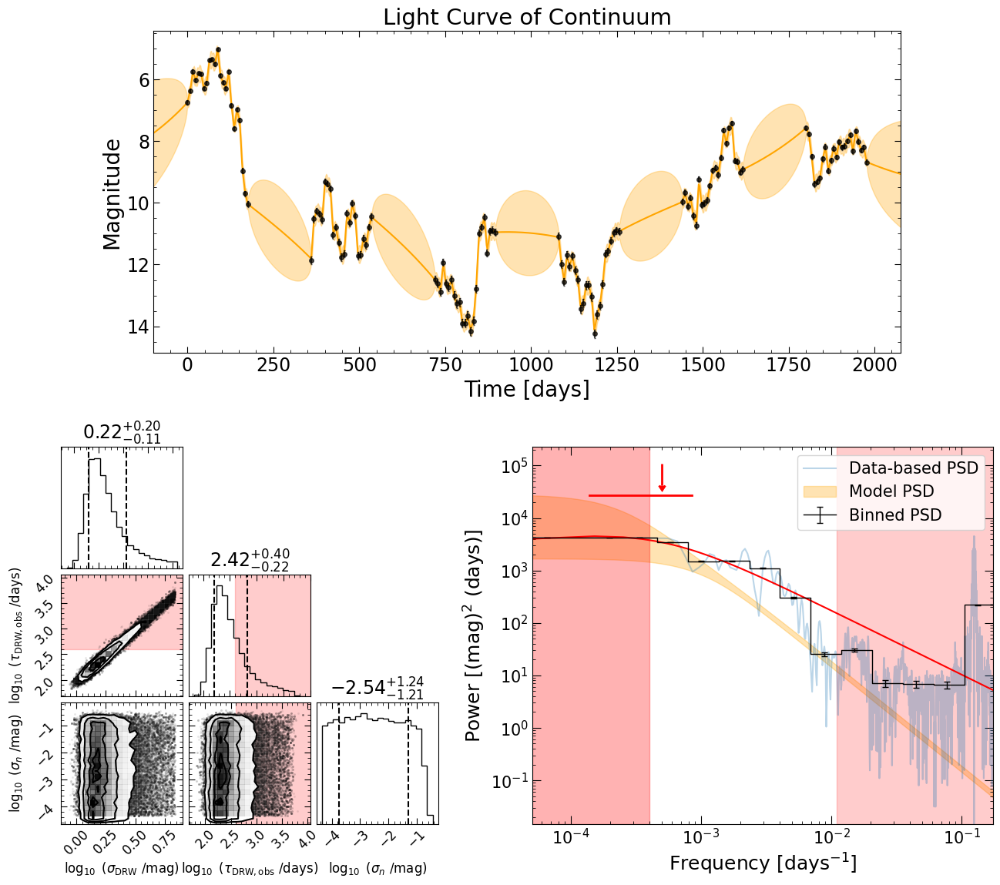

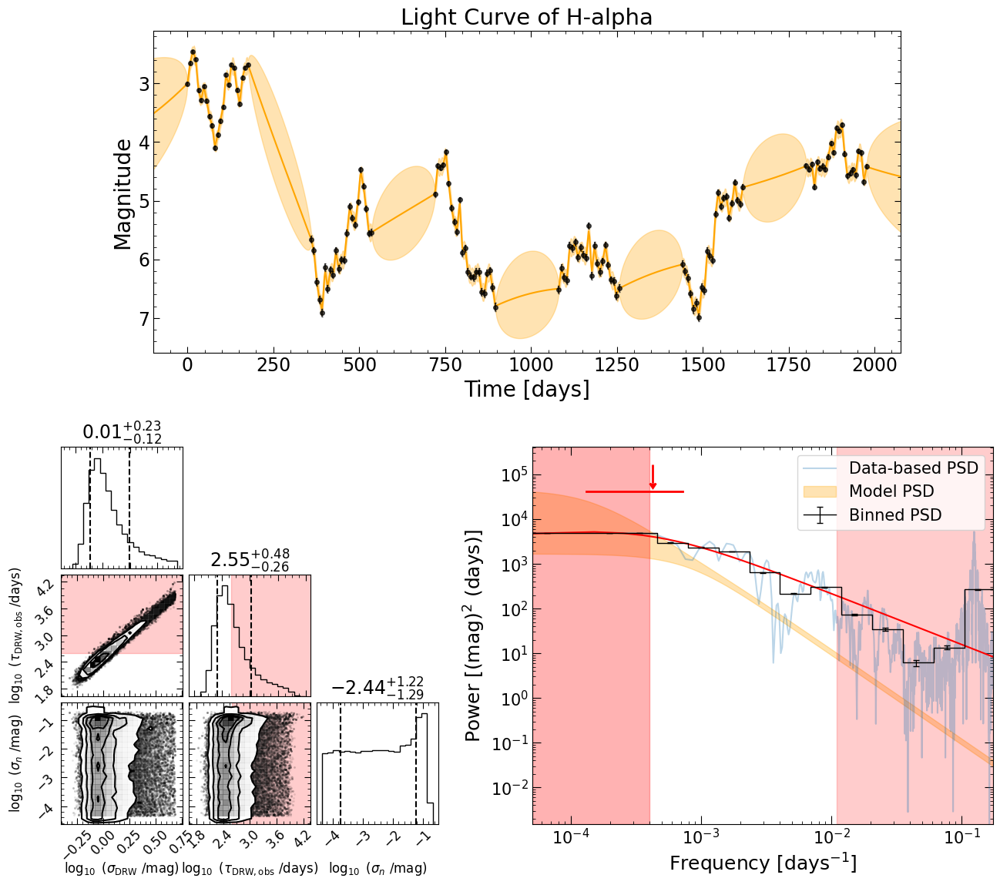

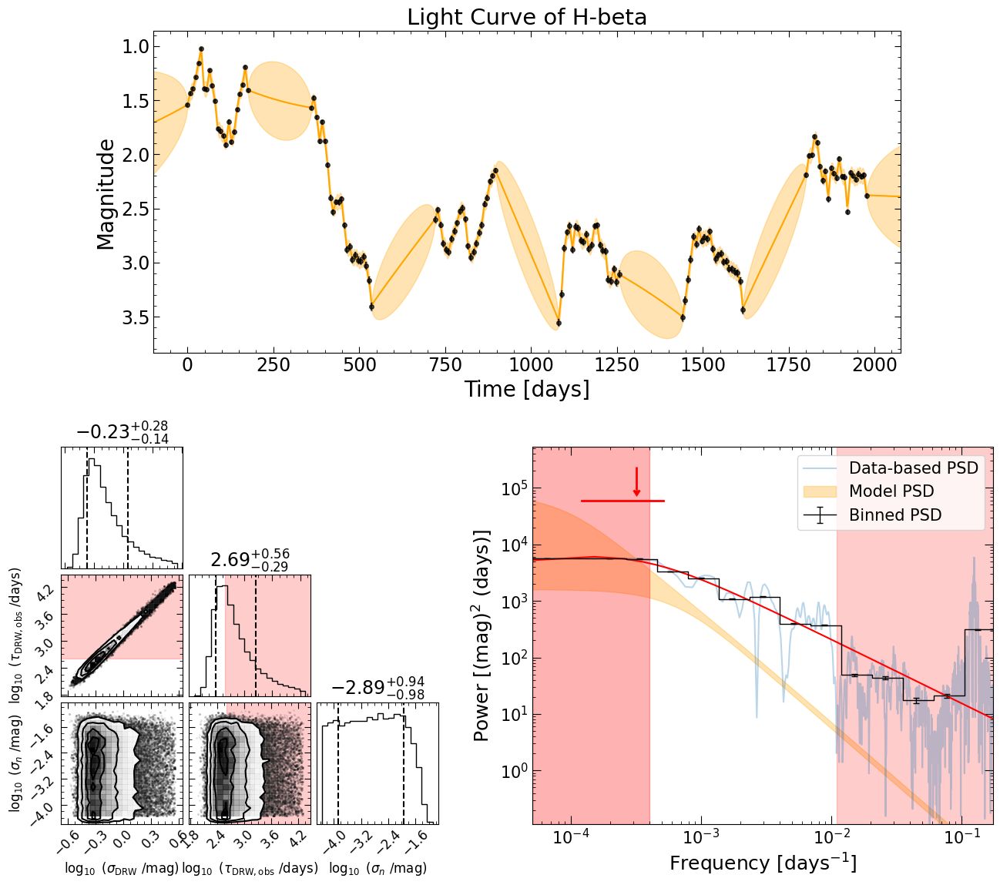

In [2]:
res = pl.run_pipeline( output_dir, filenames, line_names,
                       run_drw_rej=True, 
                       verbose=True,
                       file_fmt='ascii',
                       time_unit='d',
                       lc_unit='mag')

This will output a number of plots (like shown above) and diagnostic information in the specified ``output_dir``.

pyCCF
-----

Now, we can utilize the ``pyCCF`` code to get the (interpolated) cross-correlation function between the continuum and the two light curves. To do this, we only need to specify ``run_pyccf=True`` in ``run_pipeline``.


Running pyCCF
-----------------
lag_bounds: [None None]
interp: mean/2
nsim: 1000
mcmode: 0
sigmode: 0.2
thres: 0.8
nbin: 50
-----------------
        
Failed centroids:  0
Failed peaks:  0


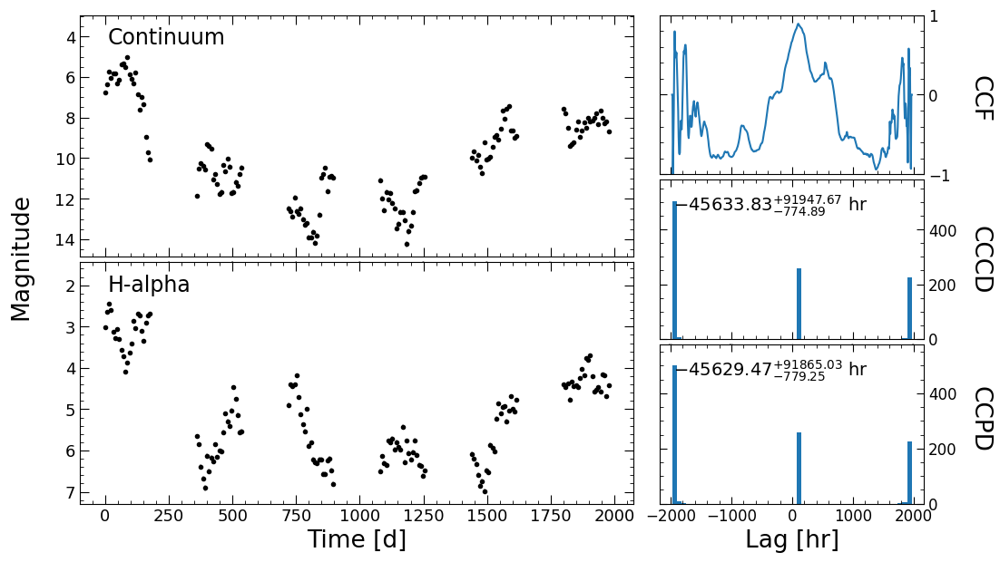

Failed centroids:  0
Failed peaks:  0


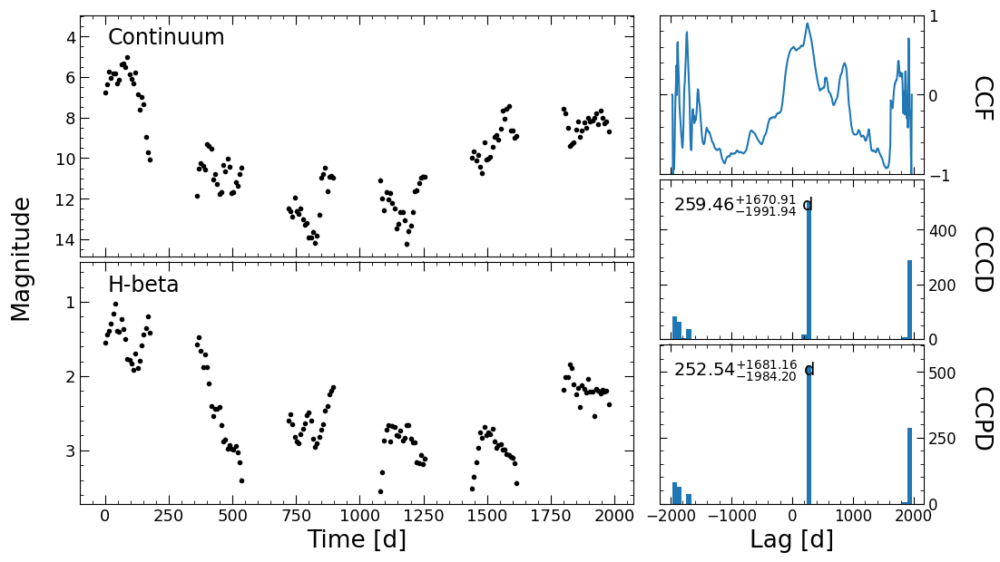

In [3]:
res = pl.run_pipeline( output_dir, filenames, line_names,
                       run_pyccf=True, 
                       verbose=True,
                       file_fmt='ascii',
                       time_unit='d',
                       lc_unit='mag')

This produced two plots showing the continuum of each of the lines, the cross-correlation function (CCF), the cross-correlation centroid distribution (CCCD), and the cross-correlation peak distribution (CCPD). 

pyZDCF
------

The next module in pyPetal is the ``pyZDCF`` module, which computes the Z-transformed Discrete Corrrelation Function between the continuum and each of the two lines. Similar to ``pyCCF``, we only need to specify ``run_pyzdcf=True`` in ``run_pipeline``.


pyZDCF begins:

pyZDCF PARAMETERS:

Autocorrelation?   False
Uniform sampling?  False
Omit zero lags?    True
Minimal # in bin:  11
# of Monte Carlo:  500
Monte Carlo seed:  123456

Binning with minimum of 11 points per bin and resolution of 0.001

372 bins actually used, 1314 inter-dependent pairs discarded.


H-alpha_zdcf.dcf written...

pyZDCF ended.



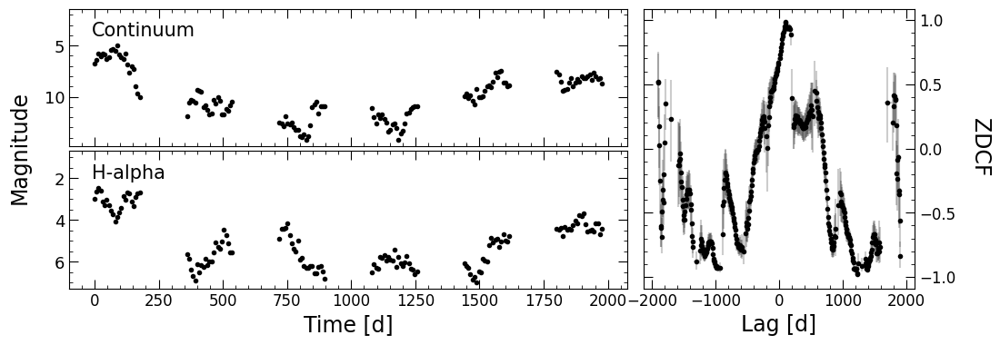


pyZDCF begins:

pyZDCF PARAMETERS:

Autocorrelation?   False
Uniform sampling?  False
Omit zero lags?    True
Minimal # in bin:  11
# of Monte Carlo:  500
Monte Carlo seed:  123456

Binning with minimum of 11 points per bin and resolution of 0.001

372 bins actually used, 1314 inter-dependent pairs discarded.


H-beta_zdcf.dcf written...

pyZDCF ended.



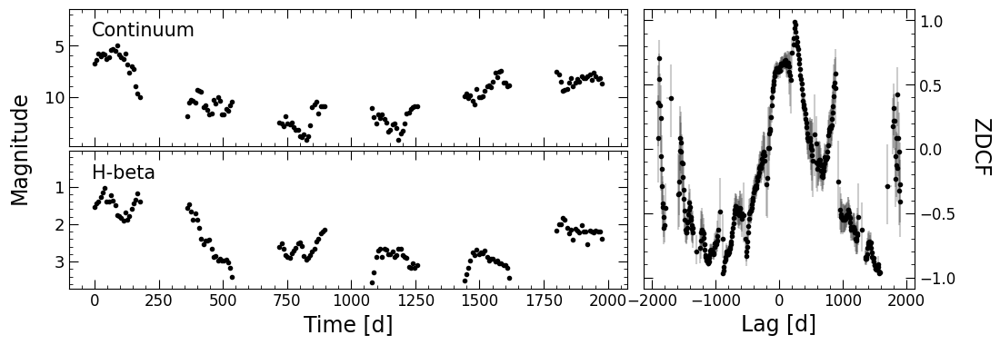

In [4]:
res = pl.run_pipeline( output_dir, filenames, line_names,
                       run_pyzdcf=True, 
                       verbose=True,
                       file_fmt='ascii',
                       time_unit='d',
                       lc_unit='mag')

JAVELIN
-------

The final module in pyPetal uses the JAVELIN code, which finds the lag between the continuum and multiple lines by interpolating with a fitted Damped Random Walk (DRW) model, convolved with a moving tophat function.

To run this module, we need to specify ``run_javelin=True`` in ``run_pipeline``.

This will fit all light curves together to the same model, and output a number of plots and diagnostic information in the specified ``output_dir``.


Running JAVELIN
--------------------
rm_type: spec
lagtobaseline: 0.3
laglimit: baseline
fixed: False
p_fix: False
subtract_mean: True
nwalker: 100
nburn: 100
nchain: 100
threads: 1
output_chains: True
output_burn: True
output_logp: True
nbin: 50
metric: med
together: True
--------------------
        
start burn-in
nburn: 100 nwalkers: 100 --> number of burn-in iterations: 10000
burn-in finished
save burn-in chains to quickstart_ouput/javelin/burn_cont.txt
start sampling
sampling finished
acceptance fractions for all walkers are
0.80 0.61 0.62 0.74 0.70 0.68 0.71 0.75 0.69 0.74 0.72 0.68 0.67 0.67 0.65 0.60 0.75 0.73 0.67 0.69 0.68 0.78 0.79 0.78 0.77 0.57 0.73 0.64 0.61 0.74 0.68 0.65 0.68 0.63 0.78 0.67 0.54 0.60 0.55 0.74 0.65 0.68 0.62 0.70 0.67 0.71 0.71 0.78 0.71 0.72 0.67 0.64 0.58 0.83 0.70 0.78 0.72 0.77 0.73 0.77 0.73 0.74 0.71 0.64 0.62 0.73 0.57 0.71 0.71 0.73 0.68 0.57 0.71 0.78 0.70 0.72 0.74 0.63 0.74 0.69 0.68 0.68 0.62 0.69 0.72 0.74 0.65 0.73 0.66 0.71 0.63 0.78 0.7

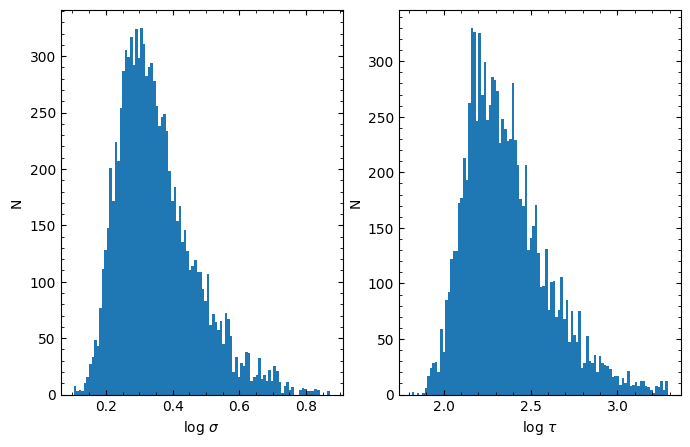

run single chain without subdividing matrix 
start burn-in
using priors on sigma and tau from continuum fitting
[[  1.76  139.55 ]
 [  2.149 209.563]
 [  2.934 391.935]]
penalize lags longer than 0.30 of the baseline
no penalizing long widths, but within the baseline
nburn: 100 nwalkers: 100 --> number of burn-in iterations: 10000
burn-in finished
save burn-in chains to quickstart_ouput/javelin/burn_rmap.txt
start sampling
sampling finished
acceptance fractions are
0.02 0.03 0.01 0.00 0.02 0.04 0.04 0.05 0.04 0.02 0.09 0.02 0.04 0.00 0.06 0.06 0.02 0.04 0.05 0.01 0.06 0.01 0.00 0.00 0.02 0.01 0.00 0.01 0.01 0.01 0.03 0.02 0.05 0.02 0.02 0.04 0.06 0.01 0.01 0.05 0.02 0.04 0.03 0.03 0.01 0.06 0.03 0.00 0.04 0.02 0.03 0.01 0.01 0.01 0.01 0.04 0.00 0.00 0.04 0.02 0.03 0.02 0.03 0.02 0.04 0.01 0.03 0.00 0.04 0.00 0.04 0.05 0.06 0.05 0.03 0.02 0.00 0.00 0.01 0.01 0.01 0.05 0.03 0.00 0.01 0.01 0.01 0.03 0.00 0.03 0.05 0.04 0.02 0.03 0.02 0.01 0.01 0.04 0.00 0.00
save MCMC chains to quickstart

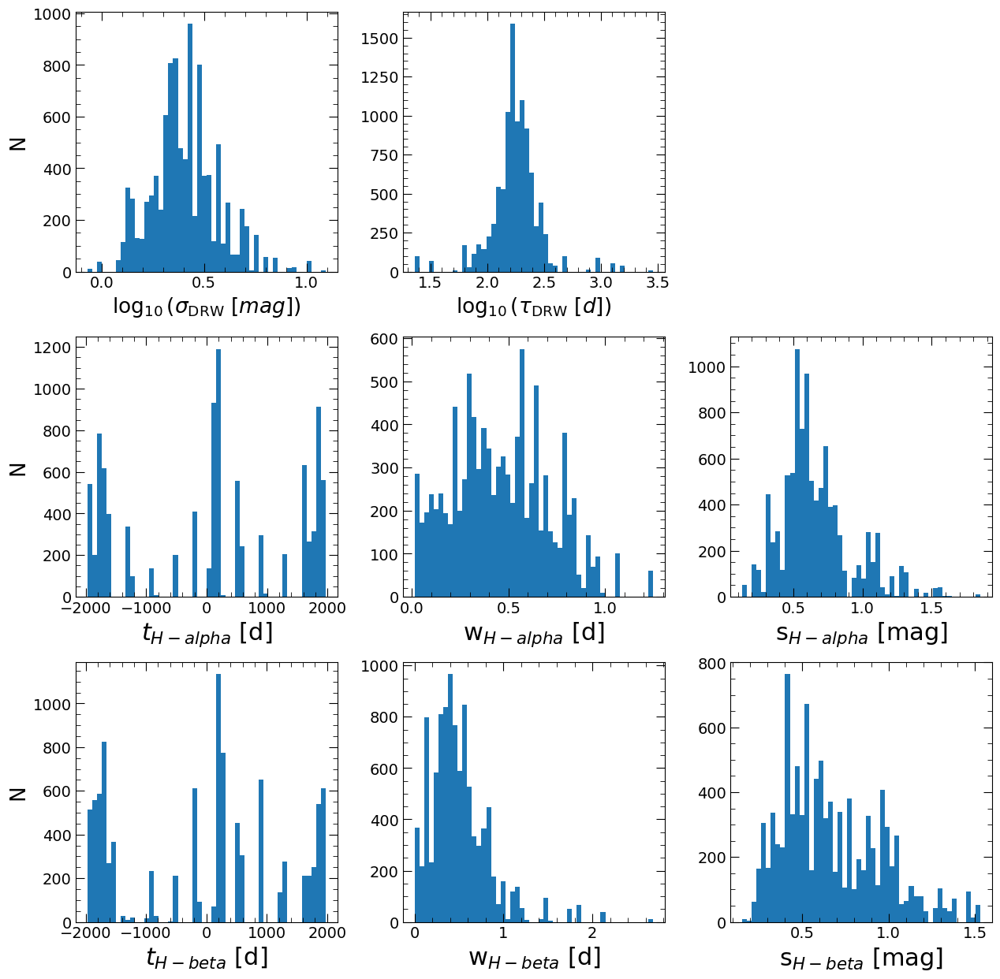

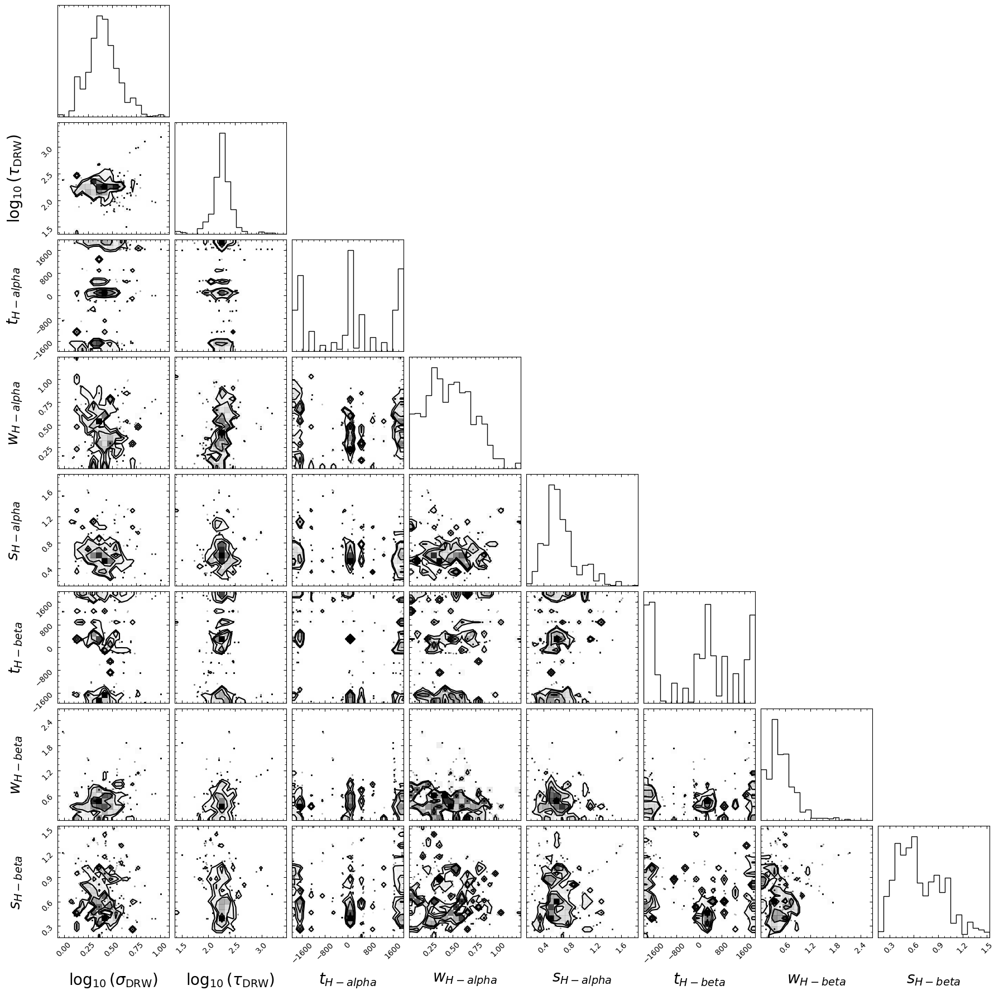

covariance matrix calculated
covariance matrix decomposed and updated by U


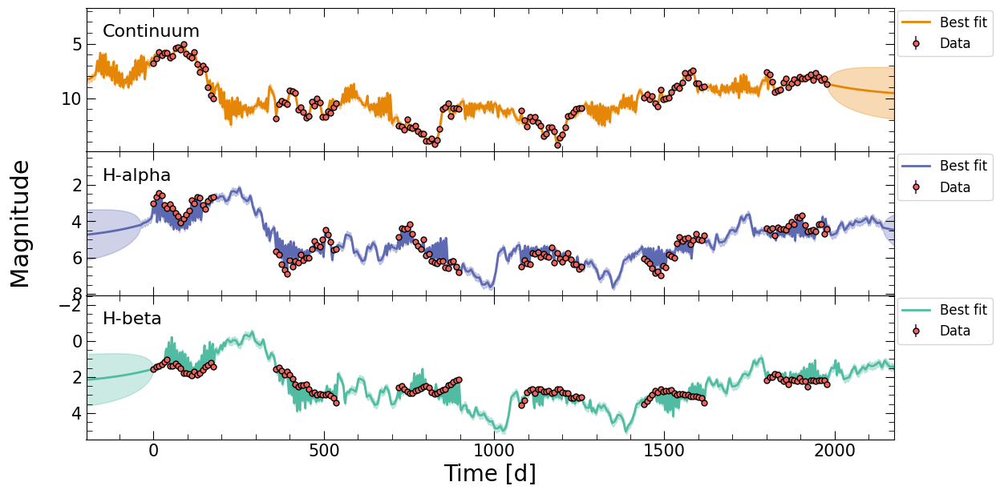

In [5]:
res = pl.run_pipeline( output_dir, filenames, line_names,
                       run_javelin=True, 
                       verbose=True,
                       file_fmt='ascii',
                       time_unit='d',
                       lc_unit='mag')

That's all of the modules available in pyPetal! There will be an output directory structured in the following way:

```
    quickstart_output/
    ├── Continuum/
    │   └── drw_rej/
    ├── H-alpha/
    │   ├── drw_rej/
    │   ├── pyccf/
    │   └── pyzdcf/
    ├── H-beta/
    │   ├── drw_rej/
    │   ├── pyccf/
    │   └── pyzdcf/
    ├── javelin/
    └── light_curves/
```

For a more in-depth look at the input options for each module and the output files and figures, see the other tutorials and API documentation.